<div style="background-color: black; color: white; padding: 10px;text-align: center;">
  <strong>Date Published:</strong> December 21, 2025 <strong>Author:</strong> Adnan Alaref
</div>

# Volleyball Video Activity Analysis

### Overview
This notebook explores a volleyball video dataset annotated with **person-level** and **group-level** activities. The main goals are:

1. Load and inspect the dataset structure.
2. Count and analyze the frequency of different **person activities** (e.g., spiking, blocking, moving).
3. Count and analyze **group activities** (e.g., team spikes, passes, points won).
4. Visualize activity frequencies with **bar charts**.
5. Visualize activity actions with **Full images and Crop Images**.
6. Prepare a clean dataset summary for further ML tasks or analysis.

### Dataset Structure
- `videos/` folder: contains video folders named numerically (`1`, `2`, …).  
- Each video folder contains:
  - `annotations.txt`: contains frame-level bounding box and activity information.
- Nested structure example:
```
videos/
├─ 1/
│ └─ annotations.txt
├─ 2/
│ └─ annotations.txt
└─ ...
```
```
volleyball_tracking_annotation/
├─ 0/
├─ 13286/
│ └─ 13286.txt
└─ ...
```

# <a id="Import"></a><div style="background: linear-gradient(to right, #1b5e20, #2e7d32, #388e3c, #43a047, #4caf50); font-family: 'Times New Roman', serif; font-size: 28px; font-weight: bold; text-align: center; border-radius: 15px; padding: 15px; border: 2px solid #ffffff; box-shadow: 0 4px 10px rgba(0, 0, 0, 0.2); -webkit-background-clip: text; -webkit-text-fill-color: transparent;">Step 1: Import Library.</div>

In [2]:
import re
import os
import cv2
import logging
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
from typing import Dict, List, TypeVar,Tuple

import warnings
warnings.simplefilter(action='ignore')
warnings.filterwarnings(action='ignore', category=FutureWarning)

In [3]:
# from google.colab import drive
# drive.mount(r'/content/drive')
dataset_root = r"/kaggle/input/group-activity-recognition-volleyball"

# <a id="Import"></a><div style="background: linear-gradient(to right, #1b5e20, #2e7d32, #388e3c, #43a047, #4caf50); font-family: 'Times New Roman', serif; font-size: 28px; font-weight: bold; text-align: center; border-radius: 15px; padding: 15px; border: 2px solid #ffffff; box-shadow: 0 4px 10px rgba(0, 0, 0, 0.2); -webkit-background-clip: text; -webkit-text-fill-color: transparent;">Step 2: Get Categories Frequenses.</div>

In [4]:
def count_activites(videos_annottations:List[str])-> Tuple[Dict[str, int], Dict[str, int]]:
  group_activity_freq, person_activity_freq = {}, {}

  # Use SETS for fast lookup Sets → O(1)
  person_activity_clases = {"waiting", "setting", "digging", "falling", "spiking", "blocking", "jumping", "moving", "standing"}
  group_activity_clases = {"r_set", "r_spike", "r-pass", "r_winpoint", "l_winpoint", "l-pass", "l-spike", "l_set"}

  for video_annot in videos_annottations:
    if not os.path.isfile(video_annot):
      raise FileNotFoundError(f"Annotaion file not found: {video_annot}")

    with open(video_annot, mode='r') as file:
      for line in file:
        parts = line.strip().split()
        for p in parts:
          if p in group_activity_clases:
            group_activity_freq[p] = group_activity_freq.get(p,0)+1

          elif p in person_activity_clases:
            person_activity_freq[p] = person_activity_freq.get(p,0)+1

  return group_activity_freq, person_activity_freq

In [7]:
person_activity_clases = ["waiting", "setting", "digging", "falling", "spiking", "blocking", "jumping", "moving", "standing"]
group_activity_clases = ["r_set", "r_spike", "r-pass", "r_winpoint", "l_winpoint", "l-pass", "l-spike", "l_set"]

videos_root = Path(dataset_root, "videos")
videos_dirs = sorted((entery.name for entery in os.scandir(videos_root)
                      if entery.is_dir() and entery.name.isdigit()), key=int)
videos_annotations_roots = [os.path.join(videos_root, video_dir, "annotations.txt") for video_dir in videos_dirs]
group_freq, person_freq = count_activites(videos_annotations_roots)

In [8]:
for cls in group_activity_clases:
  print(group_freq[cls])

644
623
801
295
367
826
642
632


In [6]:
for cls in person_activity_clases:
  print(person_freq[cls])

3600
1332
2333
1241
1216
2458
341
5120
38686


# <a id="Import"></a><div style="background: linear-gradient(to right, #1b5e20, #2e7d32, #388e3c, #43a047, #4caf50); font-family: 'Times New Roman', serif; font-size: 28px; font-weight: bold; text-align: center; border-radius: 15px; padding: 15px; border: 2px solid #ffffff; box-shadow: 0 4px 10px rgba(0, 0, 0, 0.2); -webkit-background-clip: text; -webkit-text-fill-color: transparent;">Step 3: Visual Group Activites.</div>

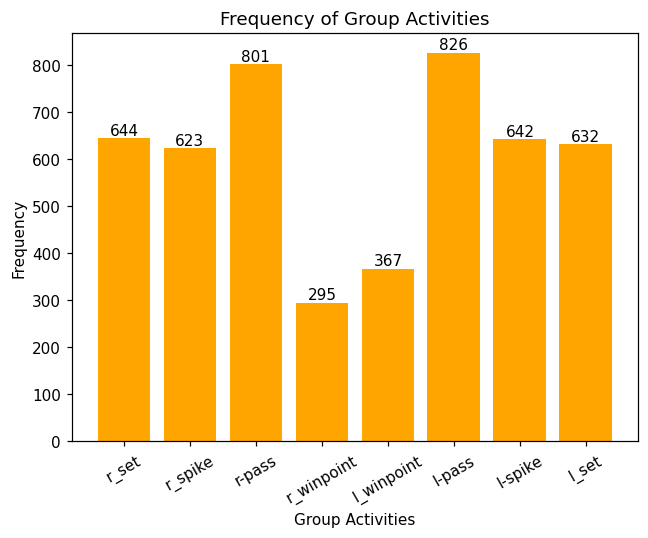

In [68]:
import matplotlib.pyplot as plt
import seaborn as sns

fig = plt.figure(figsize=(6,5), dpi=110)
freqs_group = [group_freq.get(cls, 0) for cls in group_activity_clases]
bars = plt.bar(group_activity_clases, freqs_group, color='orange')

# Add counts on top of each bar
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2,  # x position: center of bar
             height + 0.5,                    # y position: slightly above bar
             str(int(height)),                 # text: count
             ha='center', va='bottom')        # align horizontally & vertically
plt.xlabel("Group Activities")
plt.ylabel("Frequency")
plt.title("Frequency of Group Activities")
plt.xticks(rotation=30)

plt.tight_layout()
plt.show()

# <a id="Import"></a><div style="background: linear-gradient(to right, #1b5e20, #2e7d32, #388e3c, #43a047, #4caf50); font-family: 'Times New Roman', serif; font-size: 28px; font-weight: bold; text-align: center; border-radius: 15px; padding: 15px; border: 2px solid #ffffff; box-shadow: 0 4px 10px rgba(0, 0, 0, 0.2); -webkit-background-clip: text; -webkit-text-fill-color: transparent;">Step 4: Visual Person Activites.</div>

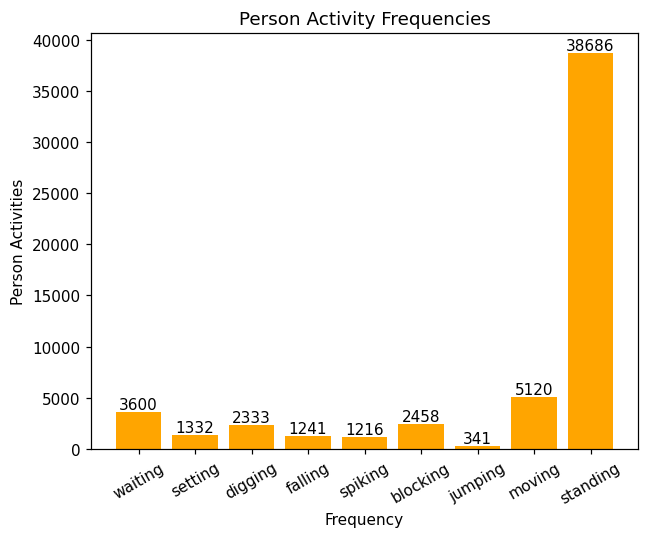

In [69]:
fig = plt.figure(figsize=(6,5), dpi=110)
freqs_person = [person_freq.get(cls, 0) for cls in person_activity_clases]
bars = plt.bar(person_activity_clases, freqs_person, color='orange')

# Add counts on top of each bar
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2,  # x position: center of bar
             height + 0.5,                    # y position: slightly above bar
             str(int(height)),                 # text: count
             ha='center', va='bottom')        # align horizontally & vertically
plt.xlabel("Frequency")
plt.ylabel("Person Activities")
plt.title("Person Activity Frequencies")
plt.xticks(rotation=30)

plt.tight_layout()
plt.show()

# <a id="Import"></a><div style="background: linear-gradient(to right, #1b5e20, #2e7d32, #388e3c, #43a047, #4caf50); font-family: 'Times New Roman', serif; font-size: 28px; font-weight: bold; text-align: center; border-radius: 15px; padding: 15px; border: 2px solid #ffffff; box-shadow: 0 4px 10px rgba(0, 0, 0, 0.2); -webkit-background-clip: text; -webkit-text-fill-color: transparent;">Step 5: Load video annotation.</div>

In [12]:
def load_video_annotation(video_annot):
  """
    Reads a volleyball annotation file.

    Parameters
    ----------
    video_annot : str
      Path to the video annotation file. Each video directory has annotations.txt file that contains selected frames annotations.
      - Each annotation line in format: {Frame ID} {Frame Activity Class} {Player Annotation} {Player Annotation} ...
      - Player Annotation corresponds to a tight bounding box surrounds each player
      - Each {Player Annotation} in format: {Action Class} X Y W H

    Returns:
    ---------
    A dictionary:
      key   -> Clip filename without extension
      value -> Group Activity Class
  """
  clips_category_dct = {}

  if not os.path.isfile(video_annot):
    raise FileNotFoundError(f"Video annotation file not found: {video_annot}")
  with open(video_annot, mode='r') as file:
    for line in file:
      line = line.strip()
      if not line:
        continue # skip empty lines

      items = line.split()[:2]
      # clip_id = items[0].replace(".jpg","") or clip_id = os.path.splitext(items[0])[0]
      # clip_id = re.sub(r'\.(jpg|jpeg|png)$', '', items[0], flags=re.IGNORECASE)
      clip_id = re.sub(r'\.[a-zA-Z0-9]+$', '', items[0], flags=re.IGNORECASE)
      clips_category_dct[clip_id] = items[1]

    clips_category_dct = dict(
      sorted(clips_category_dct.items(), key=lambda x:int(x[0]) if x[0].isdigit() else x[0])
    )
    return clips_category_dct

In [72]:
vid_annot = f'{dataset_root}/videos/0/annotations.txt'
dic = load_video_annotation(vid_annot)
print(f"Number os clips In video 0: {len(dic)}")
print(f"Clip Id and Group Activity For it:")
print(dict(list(dic.items())[:3]))

Number os clips In video 0: 153
Clip Id and Group Activity For it:
{'3596': 'r-pass', '3646': 'r_set', '3656': 'r_spike'}


# <a id="Import"></a><div style="background: linear-gradient(to right, #1b5e20, #2e7d32, #388e3c, #43a047, #4caf50); font-family: 'Times New Roman', serif; font-size: 28px; font-weight: bold; text-align: center; border-radius: 15px; padding: 15px; border: 2px solid #ffffff; box-shadow: 0 4px 10px rgba(0, 0, 0, 0.2); -webkit-background-clip: text; -webkit-text-fill-color: transparent;">Step 6: Load video-tracking annotations.</div>

In [19]:
class BoxInfo:
  def __init__(self, line:str) -> None:
    parts = line.split()
    if len(parts) != 10:
      raise ValueError(f"Invalid annotation line: {line}")

    # Extract fields
    self.action = parts[-1]
    self.player_ID = int(parts[0])

    parts = list(map(int, parts[1:-1]))
    x1, y1, x2, y2, frame_ID, lost, grouping, generated = parts
    self.box = (x1, y1, x2, y2)
    self.frame_ID = frame_ID
    self.lost = lost
    self.grouping = grouping
    self.generated = generated

  def __repr__(self) -> str:
    # return f"BoxInfo({self.__dict__})"
    return(f"BoxInfo(Player = {self.player_ID}, Frame = {self.frame_ID}, Box = {self.box}, Action = '{self.action}')")

In [20]:
ann_file = r'/kaggle/input/group-activity-recognition-volleyball/volleyball_tracking_annotation/0/13286/13286.txt'

with open(ann_file, 'r') as f:
  for l in f:
    l = l.strip()
    box_inf = BoxInfo(l)
    print(box_inf)
    break

BoxInfo(Player = 0, Frame = 13276, Box = (31, 386, 85, 511), Action = 'standing')


In [27]:
B = TypeVar('B', bound='BoxInfo')
def load_tracking_annot(annot_file:str)->Dict[int, List[B]]:
  """
    Load volleyball tracking annotations and group bounding boxes by frame.

    Reads a tracking annotation file, keeps the middle 9 frames per player
    (if available), and returns a dictionary mapping frame IDs to lists of
    BoxInfo objects.

    Parameters
    ----------
    annot_file : str
        Path to the annotation file. Each line in the file should contain the
        format: player_ID x1 y1 x2 y2 frame_ID lost grouping generated action

    Returns
    -------
    Dict[int, List[B]]
        A dictionary mapping frame_ID (int) to a list of BoxInfo objects for that frame.

    Notes
    -----
    - `BoxInfo` objects store information such as player_ID, bounding box coordinates, frame_ID, and action.
    - If a player has fewer than 9 frames, all frames for that player are kept.
    - The returned dictionary allows easy access to all player boxes per frame.
  """

  if not os.path.isfile(annot_file):
    raise FileNotFoundError(f"Annotation file not found: {annot_file}")

  # Step 1: Collect all boxes per player
  player_boxes: Dict[int, List[B]] = {idx: [] for idx in range(12)}
  with open(annot_file, mode='r') as file:
    for line in file:
      line = line.strip()
      if not line:
        continue  # skip empty lines
      box_info = BoxInfo(line)
      if box_info.player_ID > 11:
        continue
      player_boxes[box_info.player_ID].append(box_info)

  # Dictionary comprehension
  summary = {pid: len(boxes) for pid, boxes in player_boxes.items()}
  # print(summary)

  # Step 2: Keep middle 9 frames per player
  for player_ID, boxes_info in player_boxes.items():
    if len(boxes_info)>=9:
      mid = len(boxes_info)//2  # [mid-4, mid-3, mid-2, mid-1, mid, mid+1, mid+2, mid+3, mid+4]
      player_boxes[player_ID] = boxes_info[mid-4:mid+5]  # middle 9 frames
    else:
      # if less than 9 frames, keep all
      player_boxes[player_ID] = boxes_info

  # Step 3: Build frame_boxes_dic
  frame_boxes_dic = {}
  for player_id, boxes_info in player_boxes.items():
    for box_info in boxes_info:
      frame_boxes_dic.setdefault(box_info.frame_ID,[]).append(box_info)

  return frame_boxes_dic

In [55]:
ann_p = r'/kaggle/input/group-activity-recognition-volleyball/volleyball_tracking_annotation/0/13286/13286.txt'
track_annot_dic = load_tracking_annot(ann_p)
print(f"BoxInfo for all Players In Middle 9 clips in video-{0}, but we print just 2 clips Info:\n")
slice_dict = dict(list(track_annot_dic.items())[:2])
slice_dict

BoxInfo for all Players In Middle 9 clips in video-0, but we print just 2 clips Info:



{13282: [BoxInfo(Player = 0, Frame = 13282, Box = (44, 390, 107, 514), Action = 'standing'),
  BoxInfo(Player = 1, Frame = 13282, Box = (90, 449, 157, 583), Action = 'standing'),
  BoxInfo(Player = 2, Frame = 13282, Box = (250, 346, 297, 451), Action = 'standing'),
  BoxInfo(Player = 3, Frame = 13282, Box = (463, 427, 504, 568), Action = 'standing'),
  BoxInfo(Player = 4, Frame = 13282, Box = (464, 388, 506, 501), Action = 'standing'),
  BoxInfo(Player = 5, Frame = 13282, Box = (473, 366, 512, 467), Action = 'standing'),
  BoxInfo(Player = 6, Frame = 13282, Box = (625, 363, 682, 474), Action = 'standing'),
  BoxInfo(Player = 7, Frame = 13282, Box = (761, 385, 834, 498), Action = 'standing'),
  BoxInfo(Player = 8, Frame = 13282, Box = (1027, 481, 1096, 627), Action = 'standing'),
  BoxInfo(Player = 9, Frame = 13282, Box = (1025, 369, 1098, 483), Action = 'standing'),
  BoxInfo(Player = 10, Frame = 13282, Box = (1028, 387, 1079, 546), Action = 'setting'),
  BoxInfo(Player = 11, Frame = 1

# <a id="Import"></a><div style="background: linear-gradient(to right, #1b5e20, #2e7d32, #388e3c, #43a047, #4caf50); font-family: 'Times New Roman', serif; font-size: 28px; font-weight: bold; text-align: center; border-radius: 15px; padding: 15px; border: 2px solid #ffffff; box-shadow: 0 4px 10px rgba(0, 0, 0, 0.2); -webkit-background-clip: text; -webkit-text-fill-color: transparent;">Step 7: Load volleyball dataset.</div>

In [31]:
def load_volleyball_dataset(dataset_root:str):
  videos_root = os.path.join(dataset_root, "videos")
  annot_root = os.path.join(dataset_root, 'volleyball_tracking_annotation')

  # Step 1: Get all videos in videos root in sorted order.
  videos_dirs = sorted(os.listdir(videos_root), key=lambda x : int(x) if x.isdigit() else float('inf'))
  logging.info(videos_dirs)

  videos_annot = {}
  for video_dir in videos_dirs:
    video_dir_path = os.path.join(videos_root, video_dir)
    if not os.path.isdir(video_dir_path):
      continue

    # print(video_dir_path)
    # clips_root = Path(video_dir_path)
    # clips_dirs = sorted([clip.name for clip in clips_root.iterdir() if clip.is_dir()], key=lambda x : int(x) if x.isdigit() else float('inf'))

    # Step 2: Get all clips per video in sorted order.
    clips_dirs = sorted(os.listdir(video_dir_path), key=lambda x : int(x) if x.isdigit() else float('inf'))
    logging.info(clips_dirs)


    # Get an annotations.txt
    video_annotaion_path = os.path.join(video_dir_path, 'annotations.txt')
    clips_category_dct = load_video_annotation(video_annotaion_path)

    clip_annot = {}
    for clip_dir in clips_dirs:
      clip_dir_path = os.path.join(video_dir_path, clip_dir)
      if not os.path.isdir(clip_dir_path):
        continue

      annot_file = os.path.join(annot_root, video_dir, clip_dir, f"{clip_dir}.txt")
      if not os.path.isfile(annot_file):
        continue
      frames_boxes_dic = load_tracking_annot(annot_file)  # per clip per video

      clip_annot[clip_dir] = {
        'category': clips_category_dct.get(clip_dir),
        'frames_boxes_dic': frames_boxes_dic
      }

    # Get video annot for all clips inside it.
    videos_annot[video_dir] = clip_annot

  return videos_annot
data = load_volleyball_dataset(dataset_root)

In [56]:
from pprint import pprint

# Iterate over all videos & clips 
for vid, clips in data.items():
    print(f"Video ID: {vid}")
    for cid, info in clips.items():
        print(f"  Clip ID: {cid}")
        print(f"    Category: {info['category']}")
        print(f"    Number of frames: {len(info['frames_boxes_dic'])}")
        print(f"Frames boxes:")
        pprint(dict(list(info['frames_boxes_dic'].items())[:3]), indent=4)
        
        # Optional: break after first clip for preview
        break
    # Optional: break after first video for preview
    break


Video ID: 0
  Clip ID: 3596
    Category: r-pass
    Number of frames: 9
Frames boxes:
{   3592: [   BoxInfo(Player = 0, Frame = 3592, Box = (963, 412, 1032, 554), Action = 'digging'),
              BoxInfo(Player = 1, Frame = 3592, Box = (597, 359, 651, 477), Action = 'standing'),
              BoxInfo(Player = 2, Frame = 3592, Box = (734, 423, 820, 571), Action = 'standing'),
              BoxInfo(Player = 3, Frame = 3592, Box = (830, 263, 875, 378), Action = 'standing'),
              BoxInfo(Player = 4, Frame = 3592, Box = (975, 389, 1041, 515), Action = 'standing'),
              BoxInfo(Player = 5, Frame = 3592, Box = (947, 333, 1004, 447), Action = 'standing'),
              BoxInfo(Player = 6, Frame = 3592, Box = (174, 418, 232, 563), Action = 'standing'),
              BoxInfo(Player = 7, Frame = 3592, Box = (276, 335, 323, 448), Action = 'standing'),
              BoxInfo(Player = 8, Frame = 3592, Box = (448, 391, 499, 522), Action = 'standing'),
              BoxInfo(Player 

# <a id="Import"></a><div style="background: linear-gradient(to right, #1b5e20, #2e7d32, #388e3c, #43a047, #4caf50); font-family: 'Times New Roman', serif; font-size: 28px; font-weight: bold; text-align: center; border-radius: 15px; padding: 15px; border: 2px solid #ffffff; box-shadow: 0 4px 10px rgba(0, 0, 0, 0.2); -webkit-background-clip: text; -webkit-text-fill-color: transparent;">Step 8: Visualize volleyball dataset.</div>

In [63]:
ACTION_COLOR = {
    "standing": (0, 255, 0), # Green
    "moving": (255, 255, 0), # Cyan
    "blocking": (0, 0, 255), # Red
    "falling": (0, 128, 255), # Orange
    "waiting": (255, 0, 0),      # Blue
    "digging": (0, 255, 255),    # Yellow
    "spiking": (255, 0, 255),    # Magenta
    "jumping": (128, 0, 128),    # Purple
    "setting": (0, 191, 255),    # Deep sky blue

}
def visual_clip(annot_file_path:str, video_dir:str, delay = 180, image_level=False):
  """
    Visualize volleyball tracking annotations.

    Parameters
    ----------
    annot_file_path : str
        Path to tracking annotation file.
    video_dir : str
        Directory containing frame images.
    delay : int
        Delay in milliseconds between frames.
    image_level : bool, default=True
        If True → show full frames with boxes.
        If False → show cropped player images.
  """
  if not os.path.isfile(annot_file_path):
    raise FileNotFoundError("Annotation file not found..!")
  # Get frames boxes
  frames_boxes_dic = load_tracking_annot(annot_file_path)
  font = cv2.FONT_HERSHEY_SIMPLEX

  # Detect environment
  is_colab:bool = False
  try:
    from google.colab.patches import cv2_imshow
    is_colab =True
  except ImportError:
    pass

  player_first_crop = {}
  for frame_id in sorted(frames_boxes_dic.keys()):
    img_path = os.path.join(video_dir, f"{frame_id}.jpg")
    image = cv2.imread(img_path)

    if image is None:
      continue

    # ------------------
    # FRAME-LEVEL MODE
    # ------------------
    if image_level:
      for box_info in frames_boxes_dic[frame_id]:
        x1, y1, x2, y2 = box_info.box
        color = ACTION_COLOR.get(box_info.action, (255, 255, 255))
        cv2.rectangle(image, (x1, y1), (x2, y2), (0,255,0), 2)
        cv2.putText(image, box_info.action, (x1,y1-10), font, 0.5, color, 2)

      if is_colab:
        cv2_imshow(image)
      else:
        cv2.imshow("Image", image)
        if cv2.waitKey(delay) & 0xFF == 27:  # ESC to stop
          break

    # ------------------
    # PLAYER-CROP MODE
    # ------------------
    else:

      for box_info in frames_boxes_dic[frame_id]:
        player_id = box_info.player_ID
        if player_id in player_first_crop:
            continue
        x1, y1, x2, y2 = box_info.box
        color = ACTION_COLOR.get(box_info.action, (255, 255, 255))

        # crop first
        crop = image[y1:y2, x1:x2]
        if crop.size == 0:
          continue

        h, w = crop.shape[:2]
        cv2.rectangle(crop, (0,0), (w-1, h-1), (0,255,0), 2)
        cv2.putText(crop, box_info.action, (5, 15), font, 0.5, color, 2)
        player_first_crop[player_id] = crop

        all_crops_padded = [cv2.copyMakeBorder(c, 5,5,5,5, cv2.BORDER_CONSTANT, value=(255,255,255)) for c in player_first_crop.values()]
        if is_colab:
          for crop in all_crops_padded:
              cv2_imshow(crop)
        else:
          for crop in all_crops_padded:
              cv2.imshow("Crop", crop)
          if cv2.waitKey(delay) & 0xFF == 27:  # ESC to stop
            break
        break

  if not is_colab:
    cv2.destroyAllWindows()

## <a id="Import"></a><div style="background: linear-gradient(to right, #1b5e20, #2e7d32, #388e3c, #43a047, #4caf50); font-family: 'Times New Roman', serif; font-size: 28px; font-weight: bold; text-align: center; border-radius: 15px; padding: 15px; border: 2px solid #ffffff; box-shadow: 0 4px 10px rgba(0, 0, 0, 0.2); -webkit-background-clip: text; -webkit-text-fill-color: transparent;">Step 8.1: Visualize Volleyball-dataset For Full Image Level.</div>

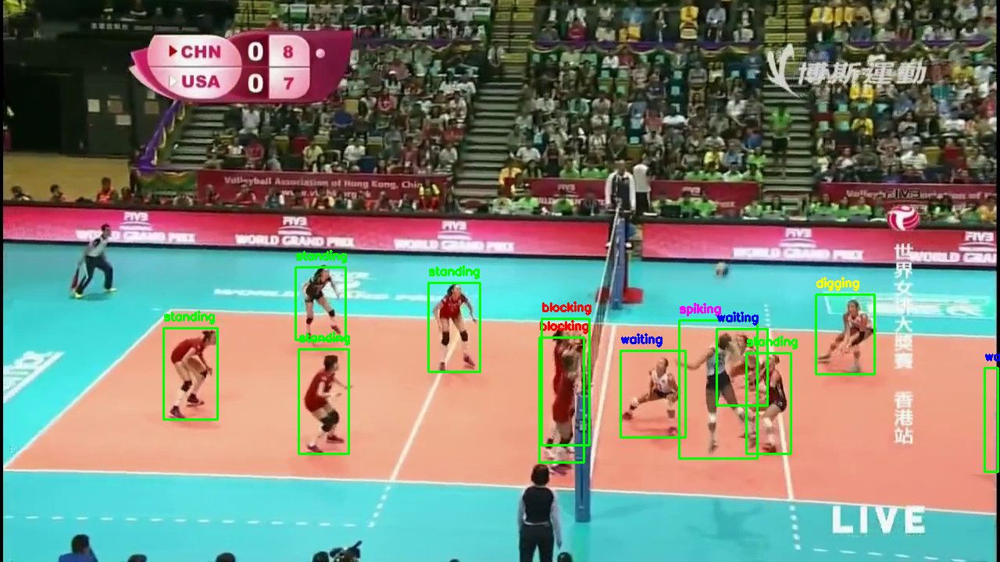

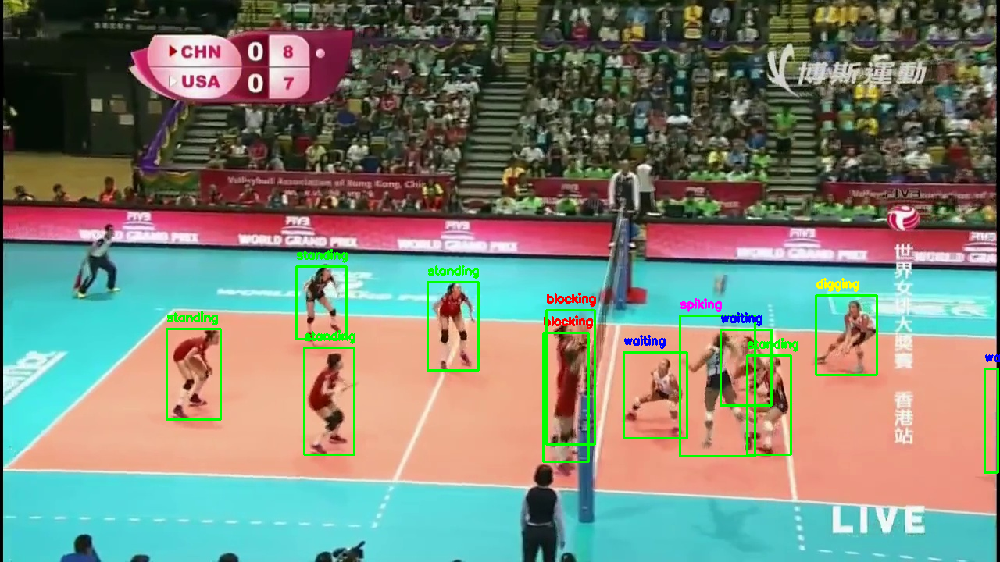

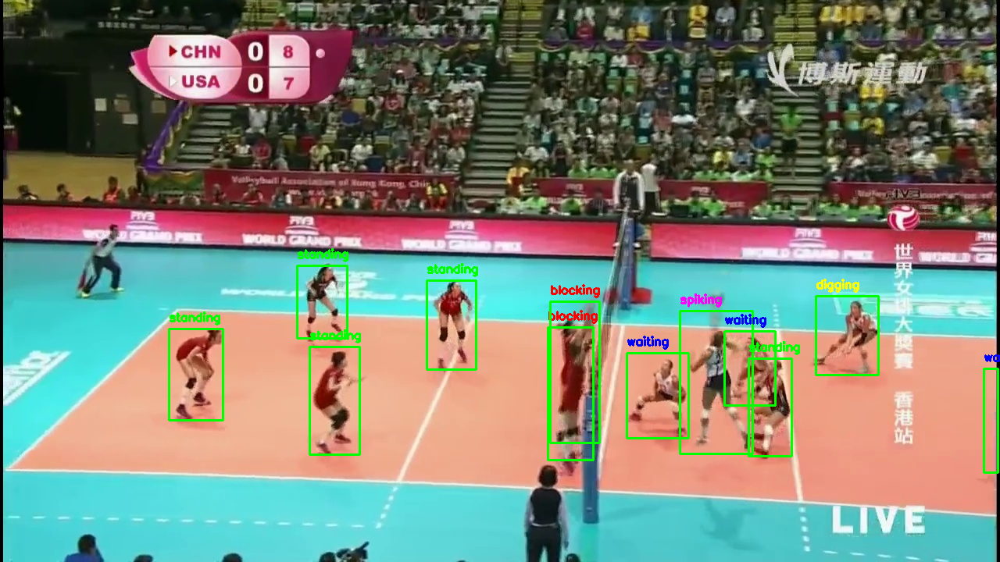

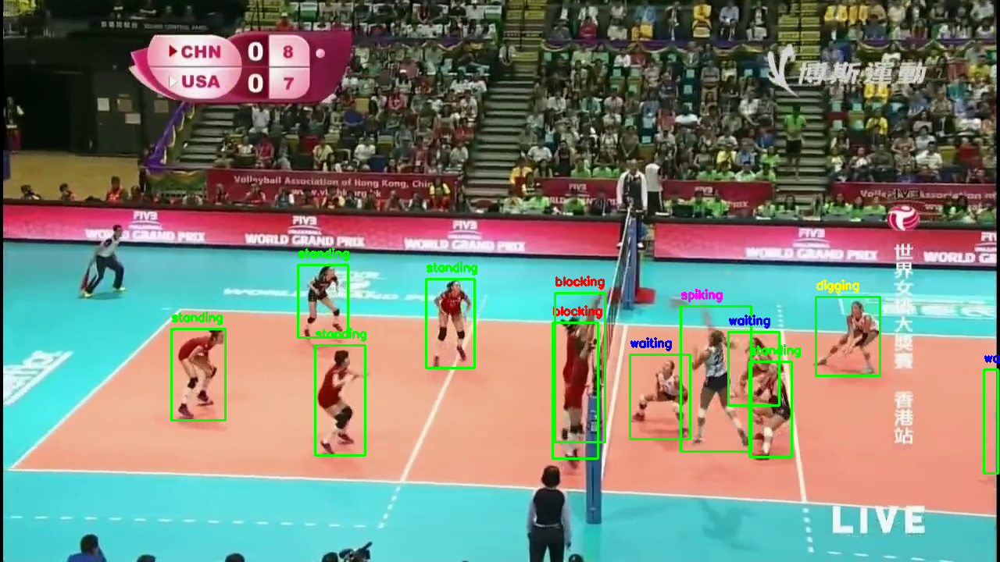

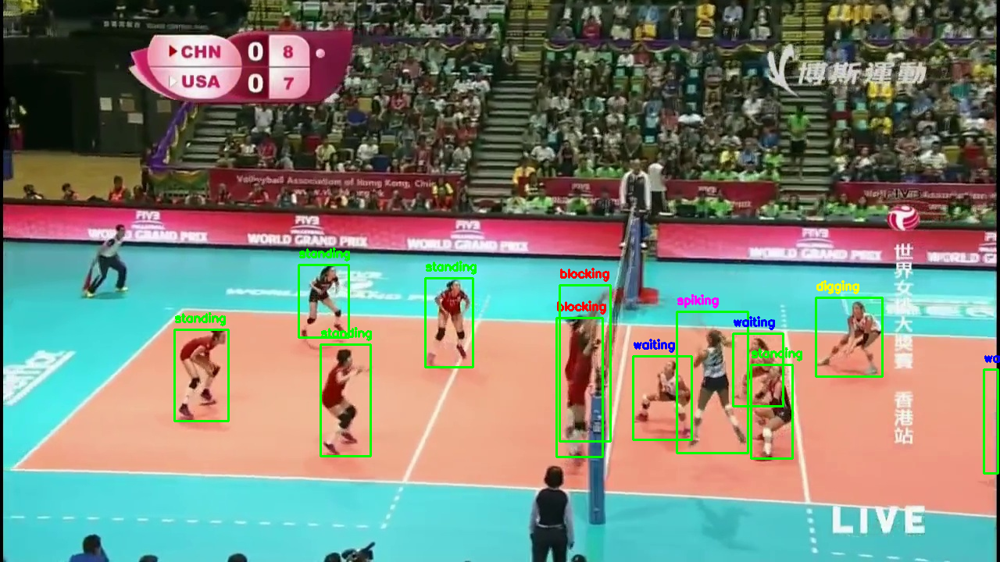

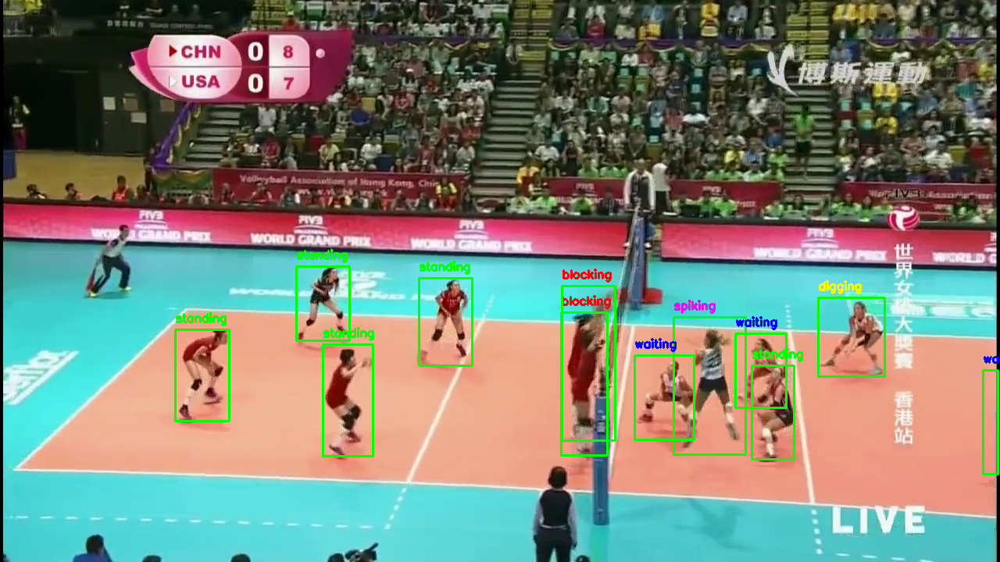

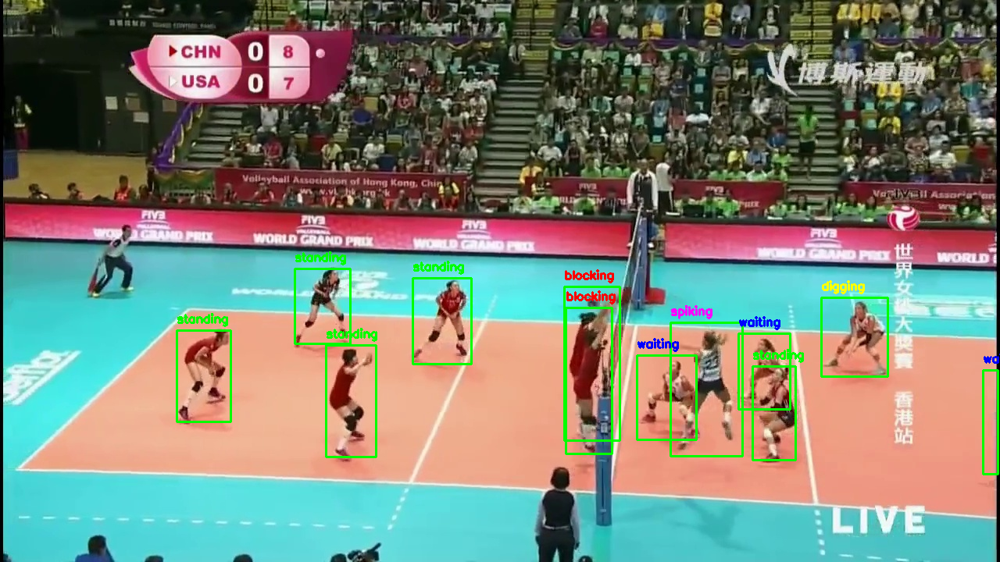

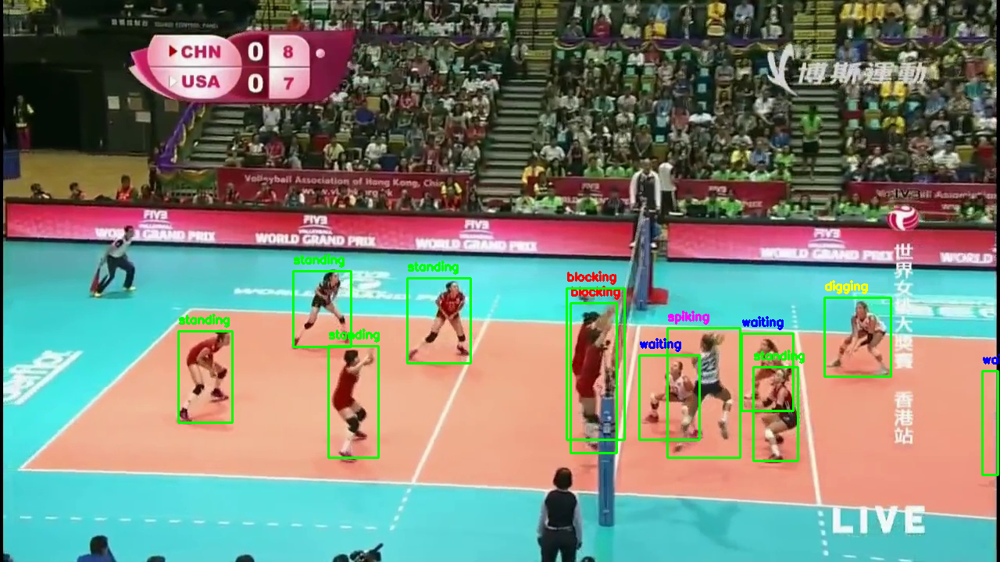

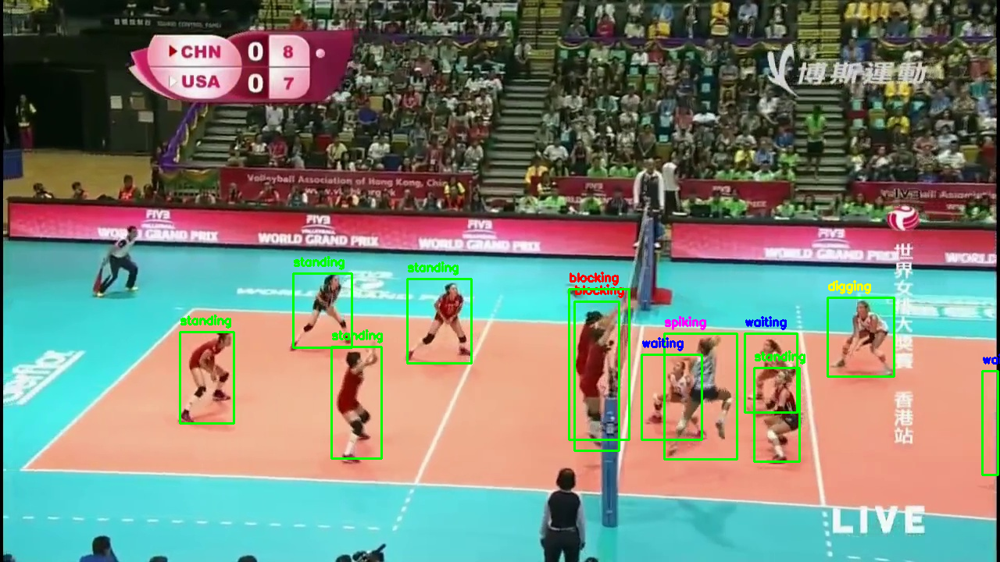

In [58]:
annot_file = f'{dataset_root}/volleyball_tracking_annotation/0/13336/13336.txt'
clip_dir_path = os.path.dirname(annot_file).replace('volleyball_tracking_annotation', 'videos')
visual_clip(annot_file, clip_dir_path, image_level=True)

## <a id="Import"></a><div style="background: linear-gradient(to right, #1b5e20, #2e7d32, #388e3c, #43a047, #4caf50); font-family: 'Times New Roman', serif; font-size: 28px; font-weight: bold; text-align: center; border-radius: 15px; padding: 15px; border: 2px solid #ffffff; box-shadow: 0 4px 10px rgba(0, 0, 0, 0.2); -webkit-background-clip: text; -webkit-text-fill-color: transparent;">Step 8.2: Visualize Volleyball-dataset For Crop Image Level.</div>

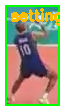

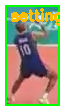

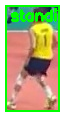

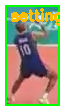

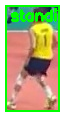

...

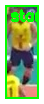

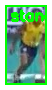

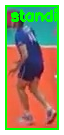

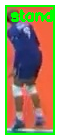

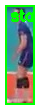

In [64]:
annot_file = f'{dataset_root}/volleyball_tracking_annotation/4/24745/24745.txt'
clip_dir_path = os.path.dirname(annot_file).replace('volleyball_tracking_annotation', 'videos')
visual_clip(annot_file, clip_dir_path, image_level=False)

# <a id="Import"></a><div style="background: linear-gradient(to right, #1b5e20, #2e7d32, #388e3c, #43a047, #4caf50); font-family: 'Times New Roman', serif; font-size: 28px; font-weight: bold; text-align: center; border-radius: 15px; padding: 15px; border: 2px solid #ffffff; box-shadow: 0 4px 10px rgba(0, 0, 0, 0.2); -webkit-background-clip: text; -webkit-text-fill-color: transparent;">Thanks & Upvote ❤️</div>